In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import plotly.express as px
from plotly.subplots import make_subplots

In [2]:
df=pd.read_csv("Samsung Dataset.csv",parse_dates=['Date'])
df.set_index('Date', inplace=True)
df

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2000-01-04,6000.0,6110.0,5660.0,6110.0,4449.709961,74195000
2000-01-05,5800.0,6060.0,5520.0,5580.0,4063.728760,74680000
2000-01-06,5750.0,5780.0,5580.0,5620.0,4092.859863,54390000
2000-01-07,5560.0,5670.0,5360.0,5540.0,4034.598877,40305000
2000-01-10,5600.0,5770.0,5580.0,5770.0,4202.098145,46880000
...,...,...,...,...,...,...
2024-06-07,78400.0,78600.0,77100.0,77300.0,77300.000000,21189349
2024-06-10,76100.0,76600.0,75600.0,75700.0,75700.000000,14598755
2024-06-11,75900.0,76000.0,75100.0,75200.0,75200.000000,16971175


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6127 entries, 2000-01-04 to 2024-06-13
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       6127 non-null   float64
 1   High       6127 non-null   float64
 2   Low        6127 non-null   float64
 3   Close      6127 non-null   float64
 4   Adj Close  6127 non-null   float64
 5   Volume     6127 non-null   int64  
dtypes: float64(5), int64(1)
memory usage: 335.1 KB


In [4]:
df.isnull().sum()

Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [5]:
df.describe()

,Open,High,Low,Close,Adj Close,Volume
count,6127.000000,6127.000000,6127.000000,6127.000000,6127.000000,6.127000e+03
mean,28370.058756,28644.142321,28084.267994,28360.006528,24504.066849,2.117578e+07
std,22589.409269,22764.800972,22394.681276,22567.361619,22041.302899,1.505888e+07
min,2540.000000,2760.000000,2420.000000,2730.000000,1988.168701,0.000000e+00
25%,10700.000000,10900.000000,10560.000000,10720.000000,7901.645264,1.169668e+07
50%,21020.000000,21420.000000,20740.000000,21060.000000,16245.702148,1.715000e+07
75%,45590.000000,46100.000000,45170.000000,45590.000000,39041.779297,2.620915e+07
max,90300.000000,96800.000000,89500.000000,91000.000000,85300.000000,1.642150e+08


## Key Insights of the table:-
### For High Price
    - Max High value is 96800.0
    - Min High value is 2760.0
    - Average high value is 28644.14
### For Low Price:-
    - Max Low value is 89500.0
    - Min Low value is 2420.0
    - Average Low value is 28084.26
### For Open Price-
    - Max Low value is 90300.0
    - Min Low value is 2540.0
    - Average Low value is 28370.05
### For Adj Close Price  
     - Max Low value is 85300.0
     - Min Low value is 1988.16
     - Average Low value is  24504.0
### For Close Price
     - Max Low value is 91000.00
     - Min Low value is 2730.0
     - Average Low value is  28360.00

In [6]:
df['50_MA'] = df['Close'].rolling(window=50).mean()
df['200_MA'] = df['Close'].rolling(window=200).mean()


In [7]:
trace_50_ma = go.Scatter(x=df.index, y=df['50_MA'], mode='lines', name='50-Day Moving Average')
trace_200_ma = go.Scatter(x=df.index, y=df['200_MA'], mode='lines', name='200-Day Moving Average')
trace_open = go.Scatter(x=df.index, y=df['Open'], mode='lines', name='Open')
trace_high = go.Scatter(x=df.index, y=df['High'], mode='lines', name='High')
trace_close = go.Scatter(x=df.index, y=df['Close'], mode='lines', name='Close')
trace_low = go.Scatter(x=df.index, y=df['Low'], mode='lines', name='Low')

layout = go.Layout(
    title='Samsung Stock Price with Moving Averages',
    xaxis=dict(title='Date'),
    yaxis=dict(title='Price'),
    hovermode='x',
    xaxis_rangeslider_visible=True
)
fig = go.Figure(data=[trace_50_ma, trace_200_ma, trace_open, trace_high, trace_close, trace_low], layout=layout)
fig.show()

## Key Insights
- The overall trend of stock price is upwards suggesting a long term uptrend.   
- The 200-days moving average gives smoother curve,showing a long term trend.
- The 50-days moving average fluctuates more as compared to the 200-days MA.It is useful for identifying the recent (short term, medium term) trends as it is sensitive to the recent price changes
- There are instances where the 50-days MA crosses 200-days MA suggesting golden cross.
- There are periods of high volatility where the price fluctuates significantly. These are indicated by large gaps between the high and low prices

In [8]:
df['VPT']=((df['Close']-df['Close'].shift(1))/(df['Close'].shift(1))*df['Volume']).cumsum()
trace_price=go.Scatter(x=df.index,y=df['Close'],mode='lines',name='Price')
trace_vpt=go.Scatter(x=df.index,y=df['Close'],mode='lines',name='Volume-price-trend')
layout=go.Layout(
title='Samsung Stock price and Voume price trend',
 xaxis=dict(title='Dates'),
 yaxis=dict(title='Price'),
 hovermode='x',
 xaxis_rangeslider_visible=True)
fig = go.Figure(data=[trace_price, trace_vpt], layout=layout)
fig.show()

## key insights:-
 #### The interpretations of the VPT can be summed up as follows:

- An increase in price, as well as volume, confirms the price trend upward.
- A decrease in price, as well as volume, confirms the price trend downward.
- An increase in price accompanied by a decreasing or flat volume trend is a divergence and may suggest that the downward price movement is weak and won’t hold.
- A decrease in price accompanied by an increasing or flat volume trend is a divergence and may suggest that the upward price movement is weak and won’t hold.  

In [9]:
df['50_Vol']=df['Volume'].rolling(window=50).mean()
df['200_Vol']=df['Volume'].rolling(window=200).mean()


In [10]:
trace_volume = go.Bar(x=df.index, y=df['Volume'], name='Volume')
trace_volume_ma50 = go.Scatter(x=df.index, y=df['50_Vol'], mode='lines', name='50-Day Volume MA', line=dict(color='orange'))
trace_volume_ma200 = go.Scatter(x=df.index, y=df['200_Vol'], mode='lines', name='200-Day Volume MA', line=dict(color='red'))
fig=make_subplots(rows=1,cols=1,shared_xaxes=True)
fig.add_trace(trace_volume, row=1, col=1)
fig.add_trace(trace_volume_ma50, row=1, col=1)
fig.add_trace(trace_volume_ma200 , row=1, col=1)
fig.update_layout(
title={'text':"Volume and Moving Averages"},
    xaxis_title="Date",
    yaxis_title="Volume", plot_bgcolor='white',
    paper_bgcolor='white',
    hovermode='x')
fig.show()

### key Insights:-
- There is steady decline in the trading volume from May 2002 to the present time.
- Inital Volume were high around 100.22 Million in Nov 2000. 
- Despite the steady decline notable volume increase is observered throughout the period.
- 50-days MA was high in the initial period then followed my an steady decline.
- From dec 2013 to Jan 2020 dispalys the constant volume with relatively occasional increase.
- Due to covid 19 there is significant hike in trading volume in early Feb 2020(high volatility).

In [11]:
fig=px.scatter(x=df['Close'],y=df['Volume'],color=df['Volume'])
fig.update_layout(title='Close Price Vs Volume',  
    xaxis_title='Close Price',  
    yaxis_title='Volume',  
    plot_bgcolor='white')
fig.update_traces(
    marker=dict(
        size=10,                 
        opacity=0.6,            
        line=dict(
            color='black',    
            width=0.5)))
fig.show()

### Key Insights:-
- The highest trading volume was 164.215 Million at a price of \$2730 (outlier)
- There is an inverse relationship(negative correlation) between the close price and trading volume.
- when the closing price are lower, the trading volume are highest.There is dense cluster of purple data points indicating the scenario.
- Most of the trading volume lies below 60 Million.

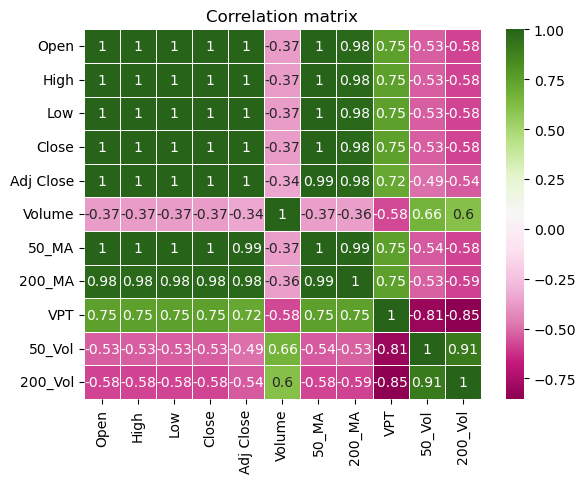

In [12]:
corr_matrix=df.corr()
sns.heatmap(corr_matrix,annot=True,linewidth=0.5,cmap='PiYG')
plt.title("Correlation matrix")
plt.show()

In [13]:
from prophet import Prophet
prophet_df=df[['Close']].reset_index()
prophet_df=prophet_df.rename(columns={"Date":"ds","Close":"y"})
prophet_df

,ds,y
0,2000-01-04,6110.0
1,2000-01-05,5580.0
2,2000-01-06,5620.0
3,2000-01-07,5540.0
4,2000-01-10,5770.0
...,...,...
6122,2024-06-07,77300.0
6123,2024-06-10,75700.0
6124,2024-06-11,75200.0
6125,2024-06-12,76500.0


In [14]:
model=Prophet()
model.fit(prophet_df)
future=model.make_future_dataframe(periods=1000)
forecast=model.predict(future)

23:04:02 - cmdstanpy - INFO - Chain [1] start processing
23:04:05 - cmdstanpy - INFO - Chain [1] done processing


C:\Users\NIKITA\AppData\Local\Temp\ipykernel_10248\949325447.py:2: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



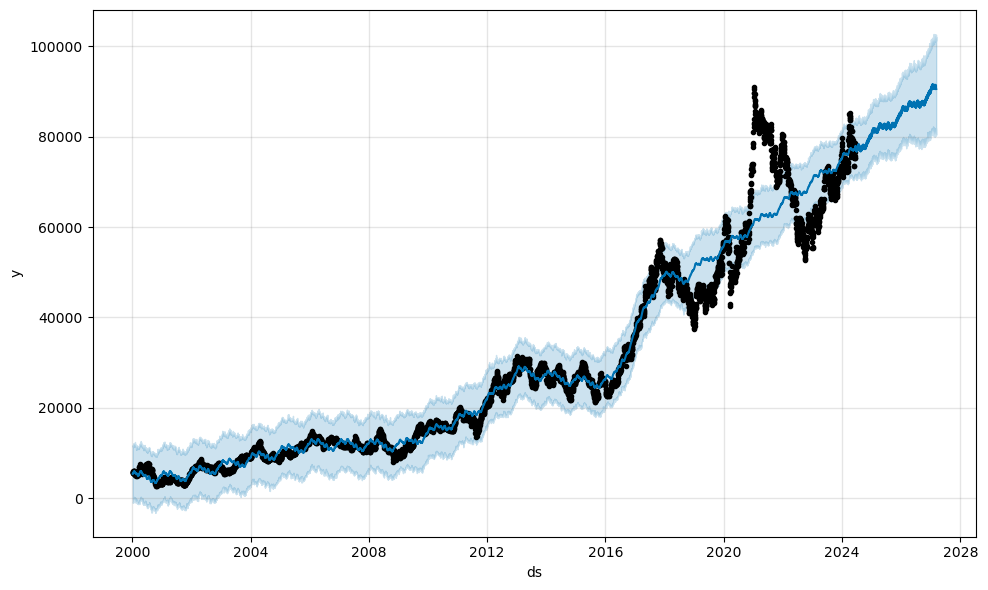

In [15]:
fig=model.plot(forecast)
fig.show()

### Key Insights
- The plot indicates the actual and predicted closing prices of Samsung closing prices stocks.
- The black line indicates the historical data and blue shaded region is the forcasted range(upper & lower) with uncertanity intervals.
- There is a clear upward trend in long-term, indicating that the samsung stock closing prices are expected to continue increasing.


C:\Users\NIKITA\AppData\Local\Temp\ipykernel_10248\2116236472.py:2: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



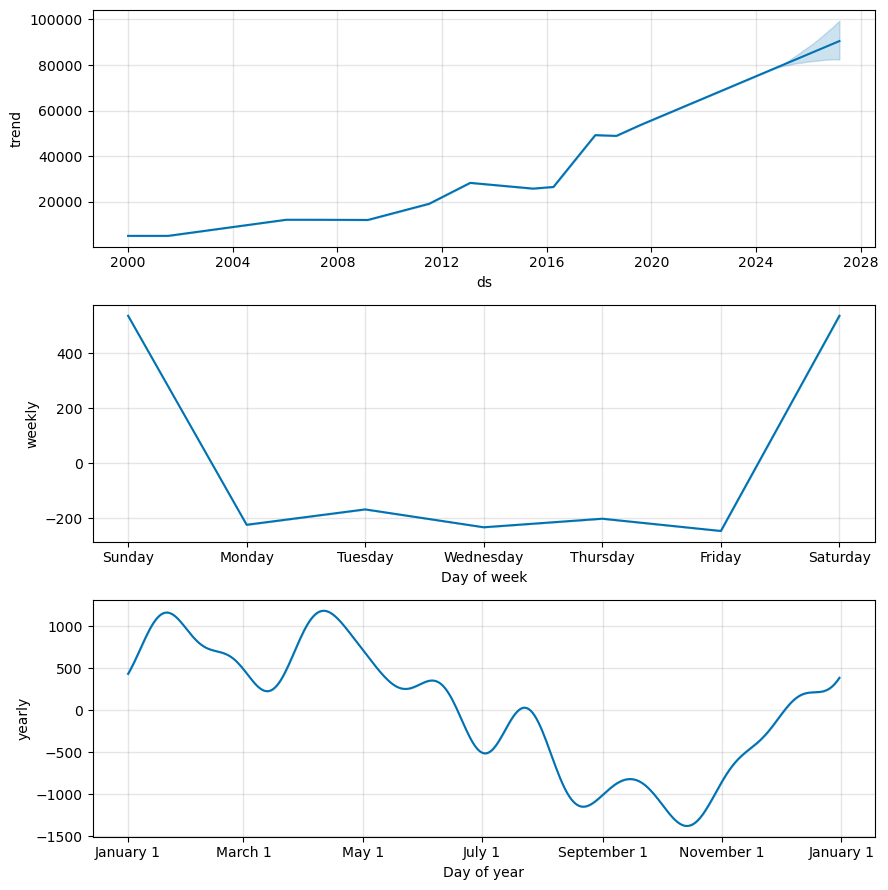

In [16]:
fig_components=model.plot_components(forecast)
fig_components.show()

### Key Insights
- The trend graph indicates the steady increase.
- Weekly graph shows how prices varies over differnt daysof the week. Prices tend to higher on Fridays and lower on Mondays.
- Yearly graph indicates how stock price varies throughout the year. Prices tends to be at peak around the beginning of the year and at May there is a dip till mid-year months and another rise towards the end of the year.


#### Overall the Prophet model suggests that the samsung stock price are likely to increase in long run with identifiable weekly and yearly patterns.